In [19]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LogNorm


In [20]:
duration_max = 24*7 # hours

In [21]:
time = np.linspace(10, 3600*duration_max, 1000)
fom = np.logspace(-3, 0, 1000)
sigma = 1 * np.sqrt(1 / (time * fom))
sigma[sigma > 1] = 1

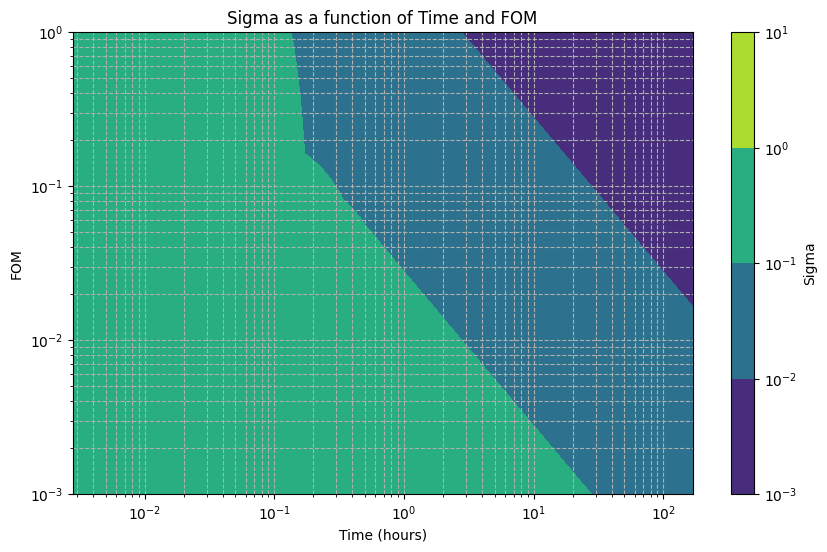

In [22]:
# create a meshgrid for time and fom
T, F = np.meshgrid(time, fom)
# calculate sigma for each combination
sigma_2d = np.sqrt(1 / (T * F))
sigma_2d[sigma_2d > 1] = 1
plt.figure(figsize=(10, 6))
contour = plt.contourf(T / 3600, F, sigma_2d, levels=1, cmap='viridis', norm=LogNorm(), origin='upper')
plt.colorbar(contour, label='Sigma')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Time (hours)')
plt.ylabel('FOM')
plt.title('Sigma as a function of Time and FOM')
plt.grid(True, which="both", ls="--")
plt.show()

In [23]:
import plotly.graph_objects as go
import numpy as np

fig = go.Figure(data=go.Heatmap(
    z=(sigma_2d),
    x=T[0] / 3600,  # Time (hours)
    y=F[:, 0],      # FOM
    colorscale='Viridis',
    colorbar=dict(
        title='Sigma',
        tickvals=np.log10([1e-2, 1e-1, 1, 10]),
        ticktext=['0.01', '0.1', '1', '10']
    ),
))
fig.update_layout(
    xaxis_type='linear',
    yaxis_type='log',
    xaxis_title='Time (hours)',
    yaxis_title='FOM',
    title='Sigma as a function of Time and FOM (log color scale)'
)
fig.show()


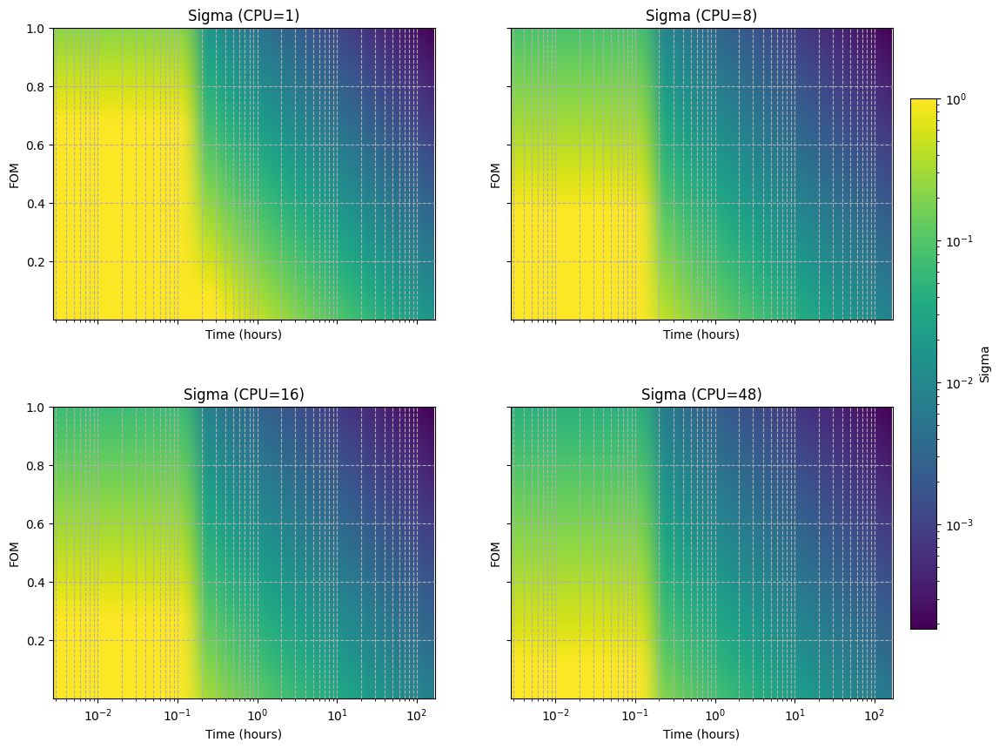

In [45]:
cpu_list = [1, 8, 16, 48]
fig, axs = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=True)
for ax, cpu in zip(axs.flat, cpu_list):
    sigma_2d_cpu = np.sqrt(1 / (T * F * cpu))
    sigma_2d_cpu[sigma_2d_cpu > 1] = 1
    im = ax.imshow(sigma_2d_cpu, extent=(time.min()/3600, time.max()/3600, F.min(), F.max()), 
                   aspect='auto', origin='lower', norm=LogNorm(), cmap='viridis')
    ax.set_xscale('log')
    ax.set_xlabel('Time (hours)')
    ax.set_ylabel('FOM')
    ax.set_title(f'Sigma (CPU={cpu})')
    ax.grid(True, which="both", ls="--")

plt.subplots_adjust(hspace=0.3, wspace=0.2, right=0.85)  # leave space on the right
cbar = fig.colorbar(im, ax=axs.ravel().tolist(), orientation='vertical', fraction=0.03, pad=0.02)
cbar.set_label('Sigma')
plt.show()


In [25]:
np.max(sigma_2d)

np.float64(1.0)

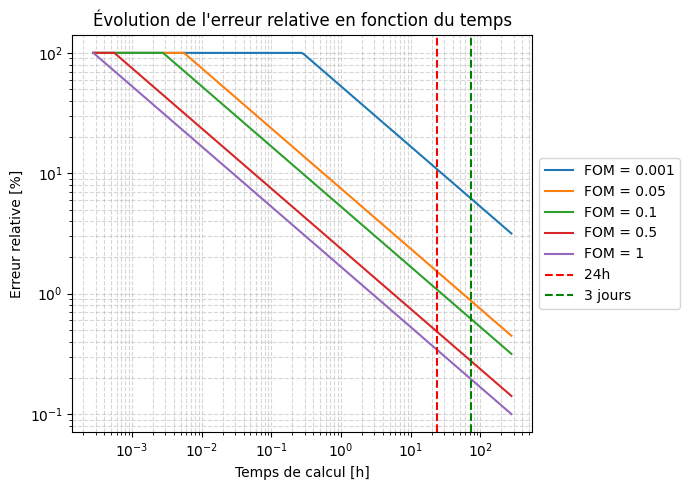

In [61]:

# --- Paramètres ---
fom_list = [1.0e-3, 5.0e-2, 1.0e-1, 5.0e-1, 1.0]  # différents FOM à comparer
t = np.logspace(0, 6, 200)  # temps de 1 à 10^4 secondes

def plot_relative_error(fom_list, t):
    plt.figure(figsize=(7,5))
    for fom in fom_list:
        R = 1 / np.sqrt(fom * t)
        R[R > 1] = 1  # l'erreur relative ne peut pas dépasser 100%
        plt.loglog(t/3600, R*100, label=f'FOM = {fom:g}')
    plt.xlabel('Temps de calcul [h]')
    plt.ylabel('Erreur relative [%]')
    plt.axvline(x=24, color='r', linestyle='--', label='24h')
    plt.axvline(x=24*3, color='g', linestyle='--', label='3 jours')
    plt.title('Évolution de l\'erreur relative en fonction du temps')
    plt.grid(True, which='both', ls='--', alpha=0.5)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout()
    plt.show()

plot_relative_error(fom_list, t)


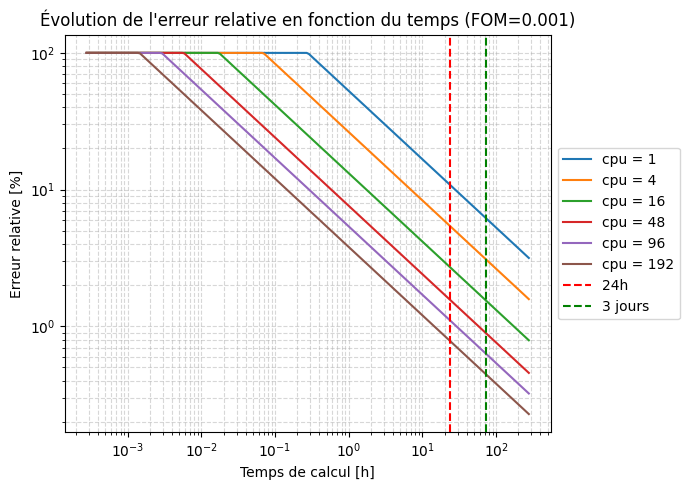

In [63]:
# --- Paramètres ---
cpu_list = [1, 4, 16, 48, 96, 192]  # différents FOM à comparer
t = np.logspace(0, 6, 200)  # temps de 1 à 10^4 secondes
fom = 1e-3
def plot_relative_error(cpu_list, t):
    plt.figure(figsize=(7,5))
    for cpu in cpu_list:
        R = (1 / np.sqrt(fom * t * cpu)) 
        R[R > 1] = 1  # l'erreur relative ne peut pas dépasser 100%
        plt.loglog(t/3600, R*100, label=f'cpu = {cpu:g}')
    plt.xlabel('Temps de calcul [h]')
    plt.ylabel('Erreur relative [%]')
    plt.axvline(x=24, color='r', linestyle='--', label='24h')
    plt.axvline(x=24*3, color='g', linestyle='--', label='3 jours')
    plt.title(f'Évolution de l\'erreur relative en fonction du temps (FOM={fom})')
    plt.grid(True, which='both', ls='--', alpha=0.5)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout()
    plt.show()

plot_relative_error(cpu_list, t)

In [64]:
def time_to_reach_sigma(sigma_target: float, 
                        FOM: float, 
                        unit: str = 's',
                        cpu:int = 1) -> float:
    if sigma_target <= 0 or FOM <= 0:
        raise ValueError("Sigma target and FOM must be positive values.")
    t = (1 / (FOM * sigma_target**2 * cpu))
    if unit == 'h':
        t /= 3600
    elif unit == 'min':
        t /= 60 
    return t
# Exemple d'utilisation
sigma_target = 0.05  # 5% d'erreur relative
FOM_values = [1.0e-3, 5.0e-3, 1.0e-2, 5.0e-2, 1.0e-1, 5.0e-1, 1.0]
for fom in FOM_values:
    t_required = time_to_reach_sigma(sigma_target, fom, unit='h')
    print(f"Pour un FOM de {fom:g}, le temps nécessaire pour atteindre une erreur relative de {sigma_target*100:.1f}% est d'environ {t_required:.2f} heures.")

Pour un FOM de 0.001, le temps nécessaire pour atteindre une erreur relative de 5.0% est d'environ 111.11 heures.
Pour un FOM de 0.005, le temps nécessaire pour atteindre une erreur relative de 5.0% est d'environ 22.22 heures.
Pour un FOM de 0.01, le temps nécessaire pour atteindre une erreur relative de 5.0% est d'environ 11.11 heures.
Pour un FOM de 0.05, le temps nécessaire pour atteindre une erreur relative de 5.0% est d'environ 2.22 heures.
Pour un FOM de 0.1, le temps nécessaire pour atteindre une erreur relative de 5.0% est d'environ 1.11 heures.
Pour un FOM de 0.5, le temps nécessaire pour atteindre une erreur relative de 5.0% est d'environ 0.22 heures.
Pour un FOM de 1, le temps nécessaire pour atteindre une erreur relative de 5.0% est d'environ 0.11 heures.
